# EXPLORATION10: CIFAR-10 이미지 생성하기
  
### CIFAR-10 dataset  
CIFAR-10 데이터 셋은 크기는 163M이고 총 60000장의 이미지와 10 classes로 구성됨,  
60000장 중 50000장은 training images, 10000장은 test images이며 사이즈는 32x32.  
class당 6000장의 이미지가 있어 계산하면 6000x10=60000장이 되는 것임.  
10개 class에는 <b>airplane, automobile, bird, cat, deer, dog, frog, horse, ship, truck</b>이 있다.  
  
우리의 목표는 <b>"DCGAN 모델을 설계해 위 10개의 class에 해당하는 이미지를 생성하기"</b>이다.  
  
### simple GAN의 문제점  
단순 신경망으로 구성한 GAN은 복잡한 영상에 대해서는 성능이 좋지 않다. 샘플에 blur가 되거나, 이해할 수 없는 이미지 등 불안정한 결과가 나타난다.  
  
### DCGAN  
● simple GAN의 문제점을 해결하기 위해 CNN을 적용했다.  
● Generator의 입력으로 들어가는 Z 값을 살짝 바꾸면, 생성되는 이미지가 그것에 감응하여 살짝 변하게 되는 vector arithmetic의 개념을 찾아냈다. z 값의 변동에 따른 Generate의 결과가 연속적으로 부드럽게 이루어져야한다.  
● Generator가 벡터 산술 연산이 가능하다. (word2vec과 같은 성질)  
● Unsupervised learning을 통해 학습된 discriminator가 image의 정보를 잘 파악하며 좋은 성능을 보인다.  
  
### Generator구조  
● 모든 max pooling layer를 Convolutional stride, fractionally-strided convolution으로 변환하여 feature-map의 크기를 키움  
● fractionally-strided convolution:input에 padding을 하기 때문에 오히려 크기가 커진자. 이를 Transposed convolution이라고 불린다.  
● Batchnormalization을 적용 (Generator의 output layer와 Discriminator의 input layer 제외) => 만약 Generator의 output layer와 Discriminator의 input layer에 적용하면 모델 불안정 해짐  
● Fully connected layer 제거  
● Generator의 output에는 Tanh를 사용하고, 나머지는 ReLU를 사용  
=> 우리의 기본 모델은 LeakyReLU사용  
● LeakyReLU(alpha): alpha: x < 0 일 때, 기울기를 지정함 ( x ≥ 0 일 때는 x = y)
  
### Discriminator 구조  
● Discriminator의 모든 layer에 LeakyReLU를 사용  
● 입력 데이터를 CNN을 거쳐 sigmoid에서 진짜 또는 가짜를 판별한다.  
  
#### Reference  
https://velog.io/@a01152a/%EB%85%BC%EB%AC%B8-%EC%9D%BD%EA%B8%B0-%EB%B0%8F-%EA%B5%AC%ED%98%84-DCGAN  
https://velog.io/@wo7864/DCGAN-%EC%BD%94%EB%93%9C%EB%A5%BC-%ED%86%B5%ED%95%9C-%EC%9D%B4%ED%95%B4

In [43]:
import os
import glob
import time

import PIL
import imageio
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
from IPython import display
import matplotlib.pyplot as plt
%matplotlib inline

## 데이터 준비하기  
1. training data의 pixcel 값 -1~1 사이 값으로 정규화  
   이는 이후 모델에서 tanh 함수를 사용하기 위함  
2. CIFAR-10의 이미지은 shape=(5000, 32, 32, 3)으로 채널 값을 갖고 있고 train_x[0]의 shape을 (32, 32, 3)으로 바꾸기,  
   image 타입은 float64인데 컴퓨터 용량을 최소화 하기 위해 float32로 바꿔주었다.  
3. 데이터 시각화 
4. 미니배치 데이터셋 구성:-tf.data.Dataset 모듈의 from_tensor_slices()함수 사용 

In [87]:
cifar10 = tf.keras.datasets.cifar10

(train_x, _), (test_x, _) = cifar10.load_data()

train_x.shape

(50000, 32, 32, 3)

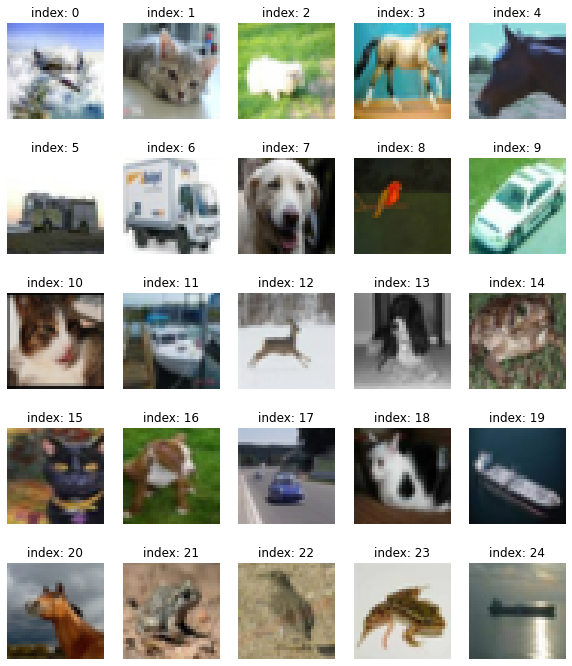

In [4]:
# 정규화 하기 이전에 데이터 시각화
plt.figure(figsize=(10, 12))

for i in range(25): #25개 이미지 띄우기
    plt.subplot(5, 5, i+1) 
    random_index = np.random.randint(1, 50000) #numpy에서 랜덤으로 정수 추출해주는 함수, index로 사용 
    #plt.imshow(train_x[random_index].reshape(32, 32, 3), cmap='brg')
    plt.imshow(train_x[random_index])
    plt.title(f'index: {i}') #이미지 제목
    plt.axis('off') 
plt.show()

In [88]:
train_x = (train_x - 127.5) / 127.5 # 이미지를 [-1, 1]로 정규화
train_x = train_x.reshape(train_x.shape[0], 32, 32, 3).astype('float32') #reshape 및 데이터 형변환

print("max pixel:", train_x.max()) #픽셀 최대값 확인
print("min pixel:", train_x.min()) #픽셀 최소값 확인
print(train_x.shape) #train data shape 확인
print(train_x.dtype) #data type 확인 

max pixel: 1.0
min pixel: -1.0
(50000, 32, 32, 3)
float32


In [89]:
#미니 배치 데이터 셋 구성
BUFFER_SIZE = 50000 # 전체 데이터셋 크기
BATCH_SIZE = 256 #모델이 한 번에 학습할 데이터의 양 => iterable 객체 만들어줌 
train_dataset = tf.data.Dataset.from_tensor_slices(train_x).shuffle(BUFFER_SIZE).batch(BATCH_SIZE) #미니배치 구성
train_dataset

<BatchDataset shapes: (None, 32, 32, 3), types: tf.float32>

# DCGAN(Deep Convolutional GAN) 모델 구성
  
### 1. 생성자 구현
(32, 32, 3)의 shape를 가진 이미지를 생성하는 생성자 모델 구현 함수(make_generator_model)를 작성  
Conv2DTranspose:이미지 사이즈를 넓혀주는 층  
BatchNormalization:신경망 가중치가 폭발하지 않도록 가중치 값을 정규화  
activation function: LeakyReLU 사용  
first layer, second layer, 커널 사이즈 8x8로 설정, 필터수는 그대로 256 설정  
Fifth: Conv2DTranspose layer에서 channel 수 3으로 설정(cifar10의 채널수는 3이므로)  
noise = tf.random.normal([1, 100])로 생성된 랜덤 노이즈를 입력으로 하여 랜덤 이미지 생성하고 이를 시각화 하기  
  
####  노이즈 벡터 만들기 및 노이즈 벡터 시각화
generator(noise, training=False)  
  
### 2. 판별자 구현  
make_discriminator_model로 판별자 생성 함수 만들기  
판별자의 입력은 (32, 32, 3) 크기의 이미지가 되고 출력은 dense layer 거쳐 단 하나의 숫자를 출력  
Conv2D층으로 이미지 크기를 점점 줄여감  
  
#### 판별자에 가짜 이미지 입력해 텐서 형태로 출력하기  
discriminator이용  
https://velog.io/@a01152a/%EB%85%BC%EB%AC%B8-%EC%9D%BD%EA%B8%B0-%EB%B0%8F-%EA%B5%AC%ED%98%84-DCGAN
 

# generator Model1
● 5 layers  
● 1 Dense layer  
● 1 reshape layer  
● 3 Conv2DTranspose layer => padding 적용으로 width, height 사이즈 키움  
● output layer 제외하고 Batchnormalization 적용  

In [47]:
#생성자 생성하는 함수1
def fst_make_generator_model(): 

    # Start
    model = tf.keras.Sequential()

    # First: Dense layer
    model.add(layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization()) #신경망 가중치가 폭발하지 않을 수 있도록 가중치 정규화 시켜줌
    model.add(layers.LeakyReLU())

    # Second: Reshape layer
    model.add(layers.Reshape((8, 8, 256))) #1차원 벡터 => 3차원 벡터로 reshape 

    # Third: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(128, kernel_size=(5, 5), strides=(1, 1), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Fourth: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(64, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Fifth: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(3, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False, \
                                     activation='tanh')) #tanh은 -1~1 사이값으로 픽셀값을 정규화시켰던 데이터셋과 동일하게 하기 위함 

    return model

fst_generator = fst_make_generator_model() #생성모델을 generator라는 변수로 생성

fst_generator.summary() #모델 세부 내용 출력 

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3 (Dense)              (None, 16384)             1638400   
_________________________________________________________________
batch_normalization_3 (Batch (None, 16384)             65536     
_________________________________________________________________
leaky_re_lu_9 (LeakyReLU)    (None, 16384)             0         
_________________________________________________________________
reshape_1 (Reshape)          (None, 8, 8, 256)         0         
_________________________________________________________________
conv2d_transpose_3 (Conv2DTr (None, 8, 8, 128)         819200    
_________________________________________________________________
batch_normalization_4 (Batch (None, 8, 8, 128)         512       
_________________________________________________________________
leaky_re_lu_10 (LeakyReLU)   (None, 8, 8, 128)        

# generator model2  
● 1 dense layer(BatchNormalization 생략)  
● 3 Conv2DTranspose layer  
● 1 Conv2D layer(output layer를 Conv2DTranspose layer => Conv2D layer로 변경)  
● 위의 모델과 다른 점이 있다면 LeakyReLU에 alpha=0.2 적용  


In [90]:
#생성자 생성하는 함수2
def snd_make_generator_model(): 

    # Start
    snd_model = tf.keras.Sequential()
 
    # First: Dense layer => 여기선 batchnormalization 생략 
    snd_model.add(layers.Dense(4*4*256, use_bias=False, input_shape=(100,)))
    snd_model.add(layers.LeakyReLU(alpha=0.2))
    snd_model.add(layers.Reshape((4, 4, 256))) #3차원 벡터로 reshape
    
    # upsample to 8x8
    snd_model.add(layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same'))
    snd_model.add(layers.LeakyReLU(alpha=0.2))
    
    # upsample to 16x16
    snd_model.add(layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same'))
    snd_model.add(layers.LeakyReLU(alpha=0.2))
    
    # upsample to 32x32
    snd_model.add(layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same'))
    snd_model.add(layers.LeakyReLU(alpha=0.2))
    
    # output layer
    snd_model.add(layers.Conv2D(3, (3, 3), activation='tanh', padding='same'))
    
    return snd_model

snd_generator = snd_make_generator_model() #생성모델을 generator라는 변수로 생성

snd_generator.summary()

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_8 (Dense)              (None, 4096)              409600    
_________________________________________________________________
leaky_re_lu_26 (LeakyReLU)   (None, 4096)              0         
_________________________________________________________________
reshape_3 (Reshape)          (None, 4, 4, 256)         0         
_________________________________________________________________
conv2d_transpose_9 (Conv2DTr (None, 8, 8, 128)         524416    
_________________________________________________________________
leaky_re_lu_27 (LeakyReLU)   (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_transpose_10 (Conv2DT (None, 16, 16, 128)       262272    
_________________________________________________________________
leaky_re_lu_28 (LeakyReLU)   (None, 16, 16, 128)      

In [91]:
noise = tf.random.normal([1, 100]) #랜덤 노이즈 벡터 생성

#fst_generated_image = fst_generator(noise, training=False) #학습중이 아니므로 training=False 설정 
#fst_generated_image.shape #첫 번째 1은 "batch_size=1"라는 뜻, 그 뒤로는 (32, 32, 3)사이즈 이미지 생성
snd_generated_image = snd_generator(noise, training=False)
snd_generated_image.shape

TensorShape([1, 32, 32, 3])

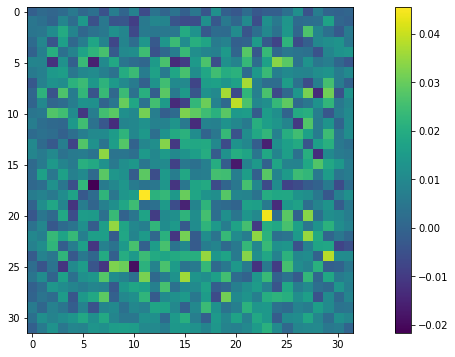

In [92]:
#랜덤 노이즈 시각화
#plt.imshow(generated_image[0, :, :, 0])
plt.imshow(snd_generated_image[0, :, :, 0])
plt.colorbar()
plt.show() 

# discriminator model1 
● 2 Conv2D layer  
● 1 flatten layer  
● 1 dense layer  
● 특징: batchnormalization 없음  

In [52]:
#판별자 생성함수1.
def fst_make_discriminator_model(): 

    # Start
    model = tf.keras.Sequential()

    # First: Conv2D Layer => downsample
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[32, 32, 3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    # Second: Conv2D Layer => downsample
    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    # Third: Flatten Layer => classifier 
    model.add(layers.Flatten()) # 이는 생성자의 Reshape 층에서 1차원 벡터를 3차원으로 변환했던 것과 정확히 반대 역할

    # Fourth: Dense Layer => classifier
    model.add(layers.Dense(1)) #하나의 값 출력 

    return model

fst_discriminator = fst_make_discriminator_model()

fst_discriminator.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 16, 16, 64)        4864      
_________________________________________________________________
leaky_re_lu_12 (LeakyReLU)   (None, 16, 16, 64)        0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 8, 8, 128)         204928    
_________________________________________________________________
leaky_re_lu_13 (LeakyReLU)   (None, 8, 8, 128)         0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 8, 8, 128)         0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 8192)             

In [94]:
#가짜 이미지 판별자에 입력, 텐서 형태로 출력
#fst_decision = fst_discriminator(generated_image, training=False)
#fst_decision #결과 값이 [0.00312621으로 보아 가짜 이미지를 가짜라고 판단을 잘하고 있음 
snd_decision = snd_discriminator(snd_generated_image, training=False)
snd_decision

<tf.Tensor: shape=(1, 1), dtype=float32, numpy=array([[0.4999327]], dtype=float32)>

# Second discriminator model
● kaggel에서 다른 DCGAN 모델 가져와서 적용해봤음  
● 4 Conv2D layer, LeakyReLU에 alpha=0.2 적용  
● 1 flatten layer  
● 1 dense layer => activation function tanh가 아닌 sigmoid 적용    

In [93]:
def snd_make_discriminator_model(): 
    
    in_shape = (32, 32, 3)
    
    model = tf.keras.Sequential()
    
    # normal
    model.add(layers.Conv2D(64, (3, 3), padding='same', input_shape=in_shape))
    model.add(layers.LeakyReLU(alpha=0.2))
    
    # downsample
    model.add(layers.Conv2D(128, (3, 3), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    
    # downsample
    model.add(layers.Conv2D(128, (3, 3), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    
    # downsample
    model.add(layers.Conv2D(256, (3, 3), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    
    # classifier
    model.add(layers.Flatten())
    model.add(layers.Dropout(0.4))
    model.add(layers.Dense(1, activation='sigmoid'))
    
    return model

snd_discriminator = snd_make_discriminator_model()

snd_discriminator.summary()

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_18 (Conv2D)           (None, 32, 32, 64)        1792      
_________________________________________________________________
leaky_re_lu_30 (LeakyReLU)   (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 16, 16, 128)       73856     
_________________________________________________________________
leaky_re_lu_31 (LeakyReLU)   (None, 16, 16, 128)       0         
_________________________________________________________________
conv2d_20 (Conv2D)           (None, 8, 8, 128)         147584    
_________________________________________________________________
leaky_re_lu_32 (LeakyReLU)   (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 4, 4, 256)        

# Loss function  
DCGAN 모델은 손실함수로 교차 엔트로피(Cross Entropy) 사용하는데 그 중에서도 binary cross entropy(한 개의 이미지가 가짜인지 진짜인지 구분하는 이진분류를 풀 때 많이 사용)를 사용, binary cross entropy는 인풋값을 [0, 1] 사이의 확률값으로 가정하므로 from_logits를 True로 설정해 입력 값을 sigmoid 함수를 사용해 [0, 1] 사이의 값으로 정규화한 후 알맞게 계산 할 수 있다.  
  
### 1.생성자 loss 구현
생성자 loss 함수는 fake_output을 입력받을 때 판별자가 가짜 이미지를 진짜 이미지로 인식하기를 원하기 때문에 가짜 이미지를 진짜 이미지 처럼 만들수록 loss 값은 작아진다.  
  
### 2.판별자 loss 구현
판별자 loss는 진짜 이미지와 가짜 이미지를 구분하기 원하므로
real_output 값은 1에 가까워지고 fake_output 값은 0에 가까워지므로 loss 값을 모두 계산한다.  
real_output은 1로 채워진 벡터, fake_output은 0으로 채워진 벡터이고 최종 판별자 loss는 "discriminator_loss = real_loss + fake_loss"이다.  
  
### 3. 판별자 accuracy 구현 
discriminator_accuracy 함수응 판별자가 real output, fake output을 얼마나 정확히 판별하는지의 accuracy를 계산한다.  
accuracy는 1에 가까울수록 졸다고 말할 수 없다 왜냐면 이 경우 생성자가 만들어내는 fake output이 real output과 차이가 많이 나기 때문에 판별자가 매우 쉽게 판별해 내고 있다는 뜻이기 때문이다. 즉, 아직은 생성자가 판별자를 충분히 잘 속이지 못하고 있다는 뜻이기도 하다.  
  
따라서 real accuracy와 fake accuracy는 초반에 1.0에 가깝게 나오다가, 서서히 낮아져서 둘 다 0.5에 가까워지는 것이 이상적이다.  

In [95]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

#생성자 loss 구현
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

#판별자 loss 구현
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

#판별자 accuracy 구현 
def discriminator_accuracy(real_output, fake_output):
    real_accuracy = tf.reduce_mean(tf.cast(tf.math.greater_equal(real_output, tf.constant([0.5])), tf.float32))
    fake_accuracy = tf.reduce_mean(tf.cast(tf.math.less(fake_output, tf.constant([0.5])), tf.float32))
    return real_accuracy, fake_accuracy

# 생산자와 판별자의 optimizer 구현  
생산자와 판별자 모두 학습을 따로 따로 진행하는 개별 네트워크 이기 때문에 optimizer도 따로 설정해준다.  
생산자와 판별자는 모두 Adam을 사용한다.   
초기 learning rate는 0.001로 설정 후 나중에 tuning해준다.  


In [104]:
#optimizer 설정 
generator_optimizer = tf.keras.optimizers.Adam(3e-4) #1e-4, 1e-5, 1e-6, 3e-4
discriminator_optimizer = tf.keras.optimizers.Adam(3e-4)

#생성자가 생성한 샘플 확인(16개 생성)
noise_dim = 100
num_examples_to_generate = 16

seed = tf.random.normal([num_examples_to_generate, noise_dim]) #seed noise 고정 
seed.shape #100차원의 노이즈 총 16개 만들기 

TensorShape([16, 100])

# 훈련 과정 구현  
  
### 1.train_step 구현  
train_step 함수: 하나의 미니 배치당 진행하는 학습 함수로 함수 위에 <b>@tf.function 데코레이터</b>를 붙여서 사용한다.  
텐서플로우에서는 데코레이터가 함수를 graph의 노드가 될 수 있는 타입으로 자동 변환해주는 역할을 해준다.  
  
더 구체적으로 함수를 살펴보면  
<b>(1) 입력 데이터:</b> Real Image 역할을 할 images 한 세트를 입력으로 받음  
  
<b>(2) 생성자 입력 노이즈:</b> generator가 FAKE IMAGE를 생성하기 위한 noise를 images 한 세트와 같은 크기인 BATCH_SIZE 만큼 생성함  
  
<b>(3) tf.GradientTape()</b>는 가중치 갱신을 위한 Gradient를 <b>자동 미분</b>으로 계산하기 위해 with 구문 열기  
  
<b>4) generated_images 생성 :</b> generator가 noise를 입력받은 후 generated_images 생성  
  
<b>(5) discriminator 판별 :</b> discriminator가 Real Image인 images와 Fake Image인 generated_images를 각각 입력받은 후 real_output, fake_output 출력  
  
<b>(6) loss 계산 :</b> fake_output, real_output으로 generator와 discriminator 각각의 loss 계산  
  
<b>(7) accuracy 계산 :</b> fake_output, real_output으로 discriminator의 정확도 계산  
  
<b>(8) gradient 계산 :</b> gen_tape와 disc_tape를 활용해 gradient를 자동으로 계산  
  
<b>(9) 모델 학습 :</b> 계산된 gradient를 optimizer에 입력해 가중치 갱신  
  
<b>(10) 리턴값 :</b> 이번 스텝에 계산된 loss와 accuracy를 리턴  
  
### 2. 훈련 과정 동안 생성된 이미지를 시각화하는 함수 구현  
generate_and_save_images() 함수는 16개의 고정된 seed를 입력으로 받아 생성한 이미지를 시각화한다.  
  
### 3.  history에 저장된 값을 매 epoch마다 시각화  

In [105]:
@tf.function
def train_step(images):  #(1) 입력데이터
    noise = tf.random.normal([BATCH_SIZE, noise_dim])  #(2) 생성자 입력 노이즈

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:  #(3) tf.GradientTape() 오픈
        #fst_generated_images = fst_generator(noise, training=True)  #(4) generated_images 생성
        snd_generated_images = snd_generator(noise, training=True)
        
        #(5) discriminator 판별
        #real_output = fst_discriminator(images, training=True)
        #fake_output = fst_discriminator(fst_generated_images, training=True)
        real_output = snd_discriminator(images, training=True)
        fake_output = snd_discriminator(snd_generated_images, training=True)
        
        #(6) loss 계산
        #gen_loss = generator_loss(fake_output)
        #disc_loss = discriminator_loss(real_output, fake_output)
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)
        
        #(7) accuracy 계산
        #real_accuracy, fake_accuracy = discriminator_accuracy(real_output, fake_output) 
        real_accuracy, fake_accuracy = discriminator_accuracy(real_output, fake_output)
    
    #(8) gradient 계산
    #gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    #gradients_of_discriminator = disc_tape.gradient(disc_loss, fst_discriminator.trainable_variables)
    gradients_of_generator = gen_tape.gradient(gen_loss, snd_generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, snd_discriminator.trainable_variables)

    #(9) 모델 학습
    generator_optimizer.apply_gradients(zip(gradients_of_generator, snd_generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, snd_discriminator.trainable_variables))

    return gen_loss, disc_loss, real_accuracy, fake_accuracy  #(10) 리턴값

In [106]:
#일정 간격으로 학습 현황을 볼 수 있는 샘플 생성하는 함수 
#고정된 seed에 대한 결과물이 얼마나 나아지고 있는지 확인
def generate_and_save_images(model, epoch, it, sample_seeds):

    predictions = model(sample_seeds, training=False)
    
    fig = plt.figure(figsize=(4, 4)) #총 16개 시각화
    
    for i in range(predictions.shape[0]):
        inverted_predictions = predictions.numpy() #numpy로 변경
        inverted_predictions = (inverted_predictions * 127.5) + 127.5 #원본 이미지와 동일해지게 역정규화해줌  
        inverted_predictions = inverted_predictions.astype(int)
        
        plt.subplot(4, 4, i+1)
        plt.imshow(inverted_predictions[i])
        #plt.imshow(predictions[i, :, :, 0])
        plt.axis('off')
   
    plt.savefig('{}/aiffel/dcgan_newimage/cifar10/generated_samples/sample_epoch_{:04d}_iter_{:03d}.png'
                    .format(os.getenv('HOME'), epoch, it)) #plt에 저장된 이미지 plt.savefig로 파일로 저장 

    plt.show()

In [107]:
#history 시각화 
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 15, 6    # matlab 차트의 기본 크기를 15,6으로 지정

def draw_train_history(history, epoch):
    # summarize history for loss  
    plt.subplot(211)  
    plt.plot(history['gen_loss'])  
    plt.plot(history['disc_loss'])  
    plt.title('model loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['gen_loss', 'disc_loss'], loc='upper left')  

    # summarize history for accuracy  
    plt.subplot(212)  
    plt.plot(history['fake_accuracy'])  
    plt.plot(history['real_accuracy'])  
    plt.title('discriminator accuracy')  
    plt.ylabel('accuracy')  
    plt.xlabel('batch iters')  
    plt.legend(['fake_accuracy', 'real_accuracy'], loc='upper left')  
    
    # training_history 디렉토리에 epoch별로 그래프를 이미지 파일로 저장
    plt.savefig('{}/aiffel/dcgan_newimage/cifar10/training_history/train_history_{:04d}.png'
                    .format(os.getenv('HOME'), epoch))
    plt.show()

# 모델을 저장하기 위한 checkpoint   
checkpoint에는 생성자와 판별자가 학습한 모델 가중치를 저장  

In [108]:
checkpoint_dir = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/training_checkpoints'

checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=fst_discriminator)

# 학습 과정 진행  

step1. 최소 50epoch 이상의 모델 학습 진행  
step2. gif 파일 생성  
step3. 학습 과정을 담은 샘플 이미지, gif 파일, 학습 진행 그래프 이미지 함께 제출  
  
### train 함수 설명  
train 함수 안에 train_step, generate_and_save_images + draw_train_history_ checkpoint 모두 합치기  
train_step: 미니 배치 학습  
generate_and_save_images: 샘플 이미지를 생성하고 저장  
draw_train_history: 학습 과정 시각화  
checkpoint: 모델까지 저장  

In [109]:
def train(dataset, epochs, save_every):
    start = time.time()
    history = {'gen_loss':[], 'disc_loss':[], 'real_accuracy':[], 'fake_accuracy':[]}

    for epoch in range(epochs):
        epoch_start = time.time()
        for it, image_batch in enumerate(dataset):
            gen_loss, disc_loss, real_accuracy, fake_accuracy = train_step(image_batch)
            history['gen_loss'].append(gen_loss)
            history['disc_loss'].append(disc_loss)
            history['real_accuracy'].append(real_accuracy)
            history['fake_accuracy'].append(fake_accuracy)

            if it % 50 == 0:
                display.clear_output(wait=True)
                generate_and_save_images(generator, epoch+1, it+1, seed)
                print('Epoch {} | iter {}'.format(epoch+1, it+1))
                print('Time for epoch {} : {} sec'.format(epoch+1, int(time.time()-epoch_start)))

        if (epoch + 1) % save_every == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        display.clear_output(wait=True)
        generate_and_save_images(generator, epochs, it, seed)
        print('Time for training : {} sec'.format(int(time.time()-start)))

        draw_train_history(history, epoch)
    
    print('gen_loss:{}   disc_loss:{}   real_accuracy:{}   fake_accuracy:{}'.format(history['gen_loss'][-1], history['disc_loss'][-1], history['real_accuracy'][-1], history['fake_accuracy'][-1])) #마지막 loss, accuracy 출력

In [110]:
save_every = 5 #모델 저장 간격
#EPOCHS = 50#50 #전체 학습 epoch 결정 

# 사용가능한 GPU 디바이스 확인
tf.config.list_physical_devices("GPU")

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

# generator model1, discriminator model1, epoch수 50 -> 100 -> 500 조절   
  
※%%time 옆에 주석 달지 말기  


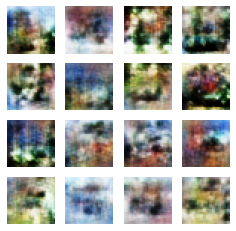

Time for training : 708 sec


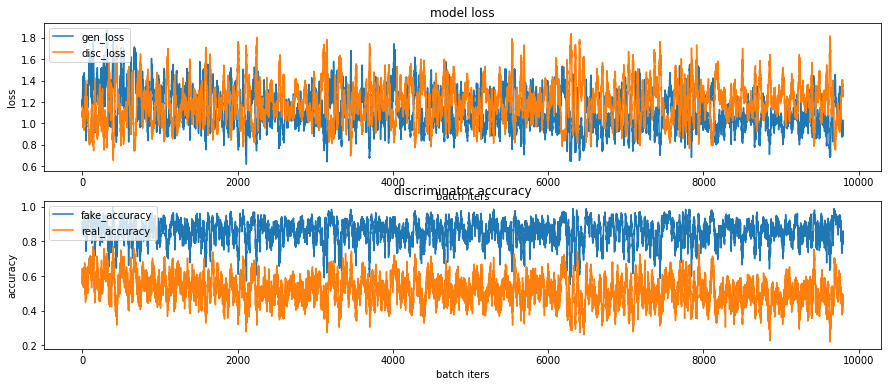

gen_loss:1.0294303894042969   disc_loss:1.3116776943206787   real_accuracy:0.42500001192092896   fake_accuracy:0.859375
CPU times: user 12min 56s, sys: 1min 19s, total: 14min 16s
Wall time: 11min 49s


In [79]:
%%time 
#해당 셀 실행 시간 측정 
train(train_dataset, 50, save_every=5) #learning rate 1e-4 

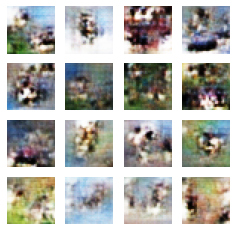

Time for training : 1444 sec


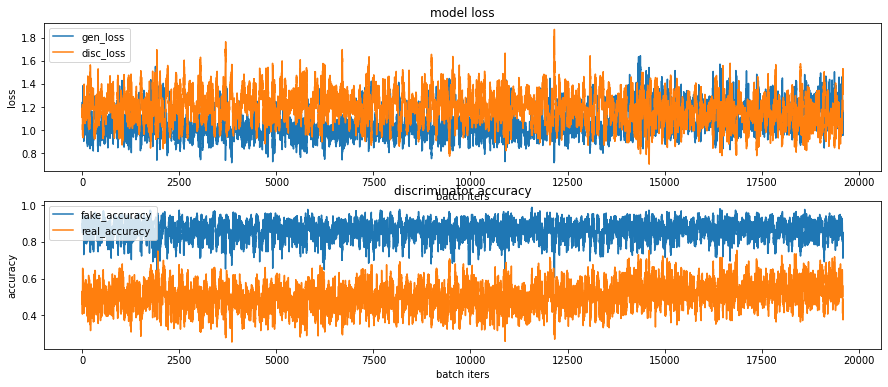

gen_loss:1.0111756324768066   disc_loss:1.5059648752212524   real_accuracy:0.4124999940395355   fake_accuracy:0.8125
CPU times: user 26min 19s, sys: 2min 39s, total: 28min 59s
Wall time: 24min 5s


In [80]:
%%time 
#해당 셀 실행 시간 측정 
train(train_dataset, 100, save_every=5) #learning rate 1e-4 

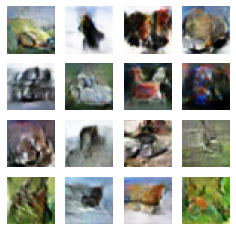

Time for training : 8017 sec


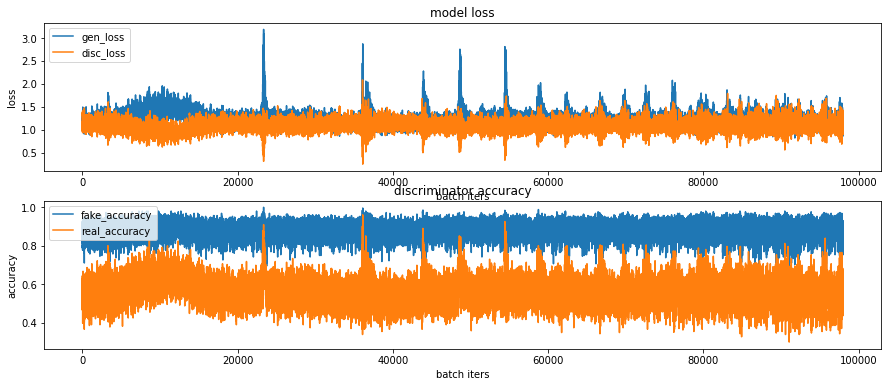

gen_loss:1.1811612844467163   disc_loss:0.9147331714630127   real_accuracy:0.6625000238418579   fake_accuracy:0.91015625
CPU times: user 2h 24min 31s, sys: 13min 38s, total: 2h 38min 9s
Wall time: 2h 13min 43s


In [81]:
%%time 
#해당 셀 실행 시간 측정 
train(train_dataset, 500, save_every=5) #learning rate 1e-4 

# generator model1, discriminator model1, epochs 100, learning rate 1e-5  -> 1e-6
  
epoch 500으로 설정했을 때 이미지가 가장 선명했으나 러닝 타임이 2시간이 넘기 때문에  
100 epoch에서 learning rate를 조절해 가장 적절한 learning rate를 찾아보았다.  
위 3가지 케이스와 비교한 결과  
<b>learning rate는 1e-4가 가장 적절해보인다.</b>


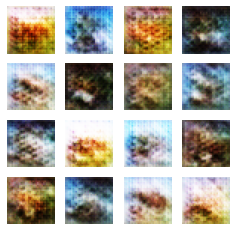

Time for training : 1467 sec


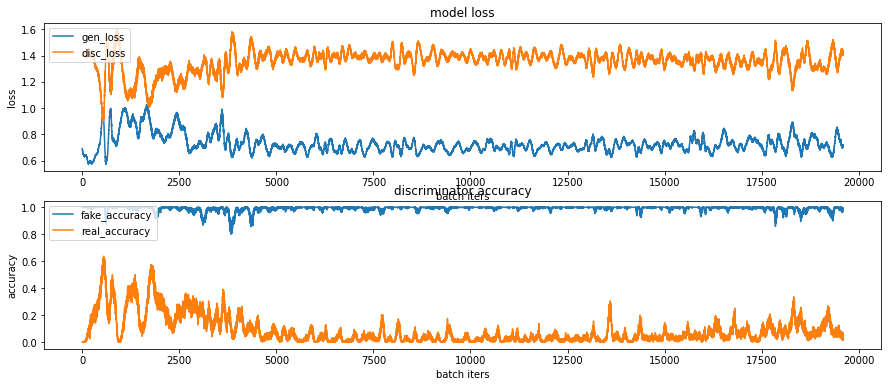

gen_loss:0.7211556434631348   disc_loss:1.4237494468688965   real_accuracy:0.012500000186264515   fake_accuracy:0.9765625
CPU times: user 25min 24s, sys: 2min 10s, total: 27min 35s
Wall time: 24min 29s


In [64]:
%%time 
#해당 셀 실행 시간 측정 
train(train_dataset, 100, save_every=5) #learning rate 1e-5 

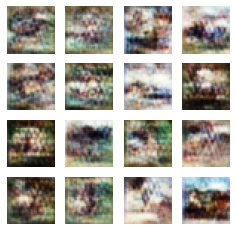

Time for training : 1461 sec


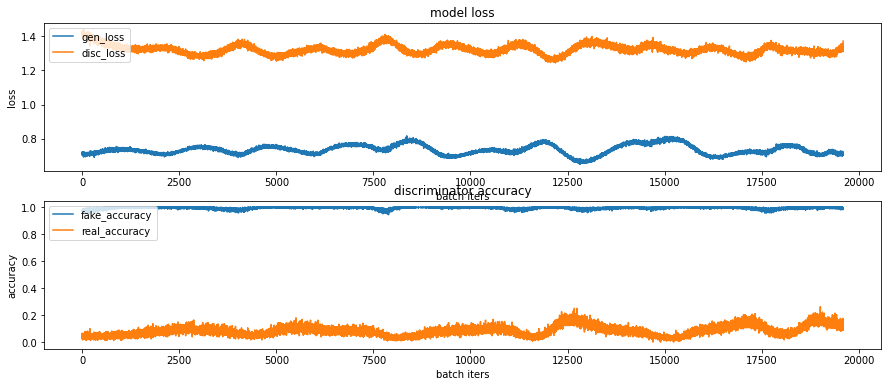

gen_loss:0.7053245306015015   disc_loss:1.3720985651016235   real_accuracy:0.11249999701976776   fake_accuracy:0.984375
CPU times: user 26min 29s, sys: 2min 37s, total: 29min 6s
Wall time: 24min 22s


In [72]:
%%time 
#해당 셀 실행 시간 측정 
train(train_dataset, 100, save_every=5) #learning rate 1e-6

# generator model2, discriminator model2, learning rate 1e-4, epoch 50 -> 100 -> 500  

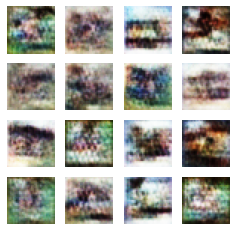

Time for training : 1688 sec


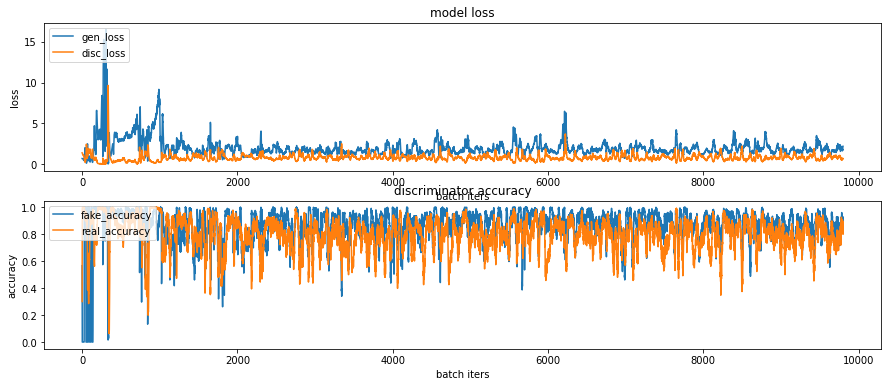

gen_loss:2.196559429168701   disc_loss:0.6829085946083069   real_accuracy:0.800000011920929   fake_accuracy:0.890625
CPU times: user 30min 37s, sys: 1min 56s, total: 32min 34s
Wall time: 28min 9s


In [86]:
%%time 
#해당 셀 실행 시간 측정 
train(train_dataset, 50, save_every=5)

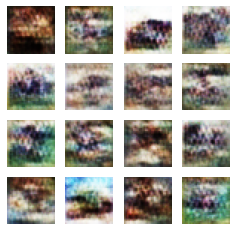

Time for training : 3395 sec


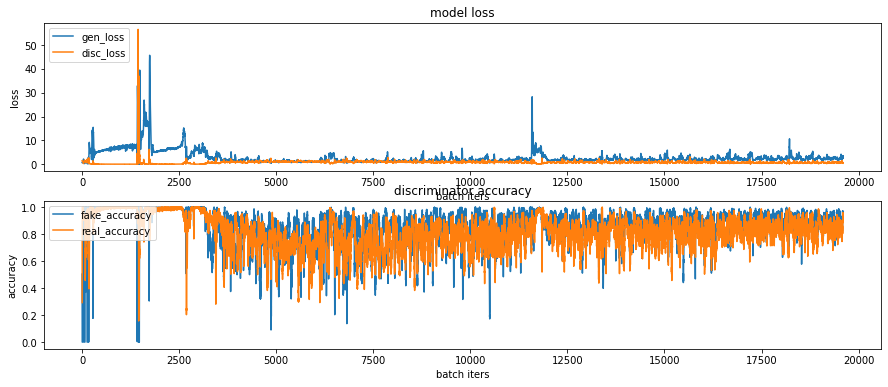

gen_loss:3.4661030769348145   disc_loss:0.38624876737594604   real_accuracy:0.887499988079071   fake_accuracy:0.9609375
CPU times: user 57min 54s, sys: 2min 16s, total: 1h 10s
Wall time: 56min 36s


In [103]:
%%time 
#해당 셀 실행 시간 측정 
train(train_dataset, 100, save_every=5)

# generator model2, discriminator model2, learning rate 3e-4, epoch 500

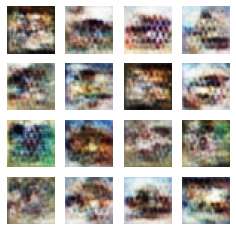

Time for training : 17750 sec


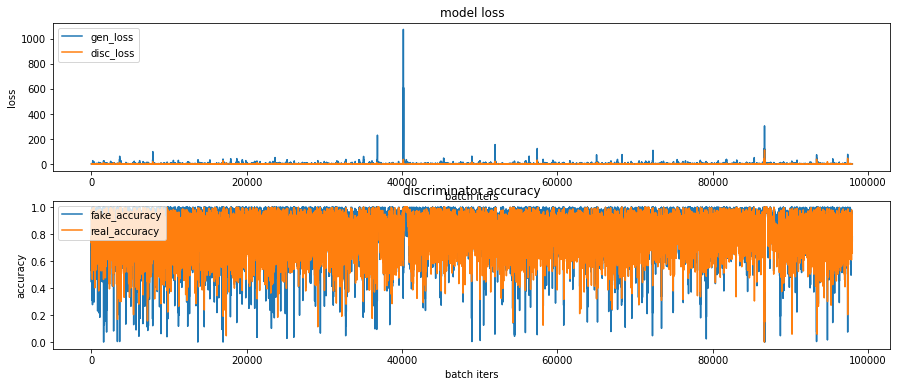

gen_loss:1.3487629890441895   disc_loss:1.2918777465820312   real_accuracy:0.6625000238418579   fake_accuracy:0.78125
CPU times: user 5h 1min 46s, sys: 11min 27s, total: 5h 13min 13s
Wall time: 4h 55min 55s


In [111]:
%%time 
#해당 셀 실행 시간 측정 
train(train_dataset, 500, save_every=5)

# 학습 과정 시각화  
gif이미지를 import 해놓았던 imageio 라이브러리를 활용해 만들기  
imageio.get_writer를 활용해서 파일을 열고, 거기에 append_data로 이미지를 하나씩 붙여나가는 방식

In [114]:
#anim_file = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/cifar10_dcgan.gif'
anim_file2 = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/second_cifar10_dcgan.gif'

with imageio.get_writer(anim_file2, mode='I') as writer:
    filenames = glob.glob('{}/aiffel/dcgan_newimage/cifar10/generated_samples/sample*.png'.format(os.getenv('HOME')))
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

!ls -l ~/aiffel/dcgan_newimage/cifar10/cifar10_dcgan.gif

-rw-r--r-- 1 root root 2998262 Feb 12 18:49 /aiffel/aiffel/dcgan_newimage/cifar10/cifar10_dcgan.gif


# GIF 파일 불러오기  
code reference  
https://github.com/ipython/ipython/issues/10045 => maedoc님 코드 참조  

# generator model1, discriminator model1, epoch 500 gif 파일 로드 


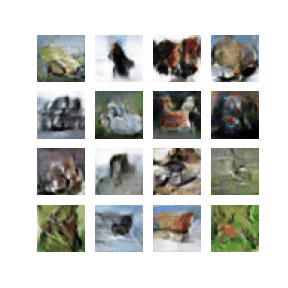

In [42]:
gif_file_path =  '/aiffel/aiffel/dcgan_newimage/cifar10/cifar10_dcgan.gif' # 파일 경로 지정 

#gif 파일 불러오는 함수 
def show_gif(fname):
    import base64
    from IPython import display
    with open(fname, 'rb') as fd:
        b64 = base64.b64encode(fd.read()).decode('ascii')
    return display.HTML(f'<img src="data:image/gif;base64,{b64}" />')

show_gif(gif_file_path)

# generator model2, discriminator model2, epoch 500 gif 파일 로드 


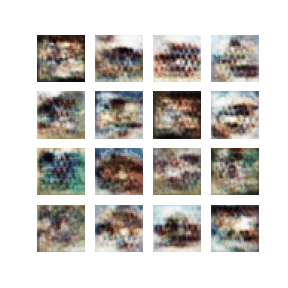

In [115]:
gif_file_path2 =  '/aiffel/aiffel/dcgan_newimage/cifar10/second_cifar10_dcgan.gif'
show_gif(gif_file_path2)

# generator model1, discriminator model1, epoch 500 image 파일 로드

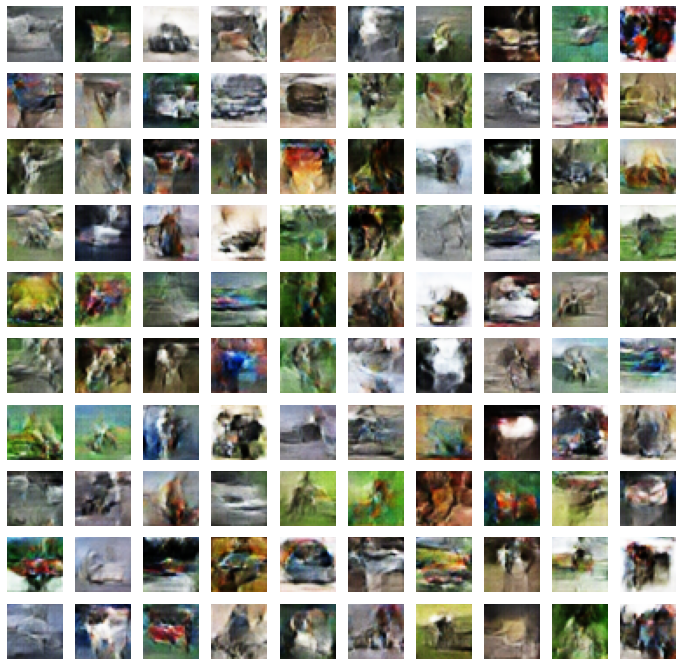

In [87]:
#checkpoint 모듈을 활용하여 모델을 로드
#학습해 둔 모델을 로드하면 모델 재학습이 필요 없이 이런 작업을 진행할 수 있음.
checkpoint_dir = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/training_checkpoints'

latest = tf.train.latest_checkpoint(checkpoint_dir)
checkpoint.restore(latest)

generator = checkpoint.generator
discriminator = checkpoint.discriminator

#로드한 모델이 정상적으로 이미지를 생성하는지 확인. 
plt.figure(figsize=(12, 12))

for i in range(100):
    plt.subplot(10, 10, i+1)
    noise = tf.random.normal([1, 100])
    generated_image = generator(noise, training=False)
    np_generated = generated_image.numpy()
    np_generated = (np_generated * 127.5) + 127.5   #역정규화를 하여 이미지를 출력, 이미 
    np_generated = np_generated.astype(int)
    plt.imshow(np_generated[0])
    plt.axis('off')
plt.show()

# generator model2, discriminator model2, epoch 500 image 파일 로드

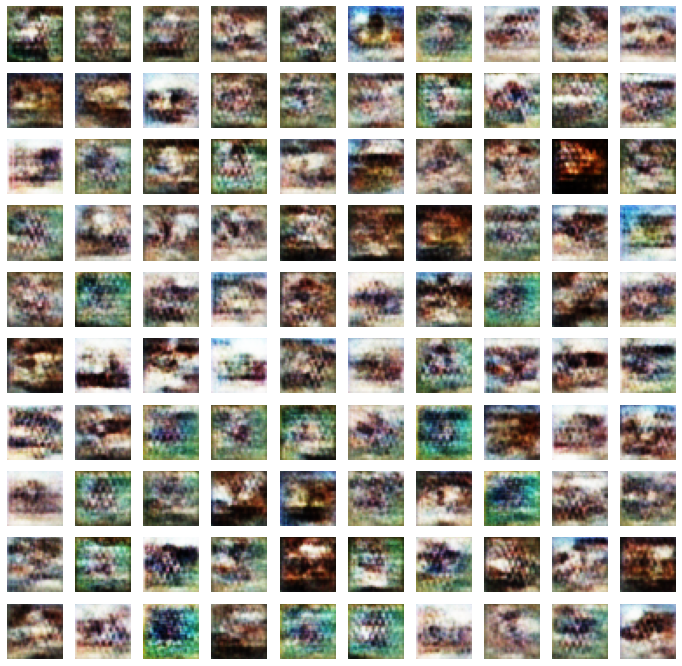

In [116]:
#checkpoint 모듈을 활용하여 모델을 로드
#학습해 둔 모델을 로드하면 모델 재학습이 필요 없이 이런 작업을 진행할 수 있음.
def read_images():
    checkpoint_dir = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/training_checkpoints'

    latest = tf.train.latest_checkpoint(checkpoint_dir)
    checkpoint.restore(latest)

    generator = checkpoint.generator
    discriminator = checkpoint.discriminator

    #로드한 모델이 정상적으로 이미지를 생성하는지 확인. 
    plt.figure(figsize=(12, 12))

    for i in range(100):
        plt.subplot(10, 10, i+1)
        noise = tf.random.normal([1, 100])
        generated_image = generator(noise, training=False)
        np_generated = generated_image.numpy()
        np_generated = (np_generated * 127.5) + 127.5   #역정규화를 하여 이미지를 출력, 이미 
        np_generated = np_generated.astype(int)
        plt.imshow(np_generated[0])
        plt.axis('off')
    plt.show()

read_images()

# Result  
● 첫번째 모델이 두번째 DCGAN 모델보다 더 선명한 이미지를 출력  
● 두번째 모델은 batchnorm을 사용하지 않아 이미지 생성하는데 엄청 느렸음(500epoch 4시간 55분) => gif 이미지도 엄청 천천히 변함  

# Discussion  
dcgan은 학습 시간이 엄청 오래 걸린다. 500 epoch돌릴 때 2시간 30분이 걸릴 정도니까. 월요일 풀잎스쿨 발표 준비, exploration 2개 제출, 토요일 풀잎스쿨 준비까지... 이 모두를 다 하면서 500 epoch 이상 돌리는게 가능할까? 아니지... 문제는 500epoch 이상 돌려야 이미지가 선명하게 출력된다는 점이다. 검색해보니 어떤 dcgan은 2만 epoch 이상 돌려야 기대한 이미지가 출력됐다는데 하... 하소연은 여기 까지만 하고 시간이 없으니 <b>모델의 성능을 더 높여줄 수 있는 방법을 예상해보고 아래에 정리하겠다.</b>  
  
1. BatchNormalization 사용  
모든 layer에서 batchnorm을 사용하면 oscillation과 model instability가 생기기 때문에 generator의 output layer와 discriminator의 input layer에는 사용을 피한다.  
  
  
2. ReLU, Leaky ReLU, Tanh  
ReLU는 generator에 권장된다. 그렇지만 discriminator에서는 아니다. 대신에, ReLU의 변형체 예를들어 Leaky ReLU와 같은 것들을 discriminator에 사용하도록 권장 한다.  
  
  
3. Adam optimizer 사용  
위에서도 Adam을 사용했는데 reference에 따르면 learning rate가 0.0002가 적당함을 찾았고 momentum beta1은 0.9에서 트레이닝 변동성이 크고 불안정한 반면 0.5에서 학습이 안정적이다.   
  
  
4. label 사용  
우리의 경우 y_train, y_test를 사용하지 않고 자기자신을 label로 삼았는데 reference에 따르면 discriminator의 label에 random noise를 약간 추가하는 label smoothing 방식을 적용해 보라는데 아마 noise 추가로 판별 능력을 키울 수 있도록 하라는 의미인 것 같다.  
#### Reference 
● https://velog.io/@wo7864/DCGAN-%EC%BD%94%EB%93%9C%EB%A5%BC-%ED%86%B5%ED%95%9C-%EC%9D%B4%ED%95%B4  
● https://machinelearningmastery.com/how-to-train-stable-generative-adversarial-networks/